# Preferential Bayesian Optimization: RANDOM
This notebook demonstrates the use of random querying on ordinal (preference) data.

Formulation by Nguyen Quoc Phong.

In [1]:
import numpy as np
import gpflow
import tensorflow as tf
import tensorflow_probability as tfp
import matplotlib.pyplot as plt
import sys
import os
import pickle

from gpflow.utilities import set_trainable, print_summary
gpflow.config.set_default_summary_fmt("notebook")

sys.path.append(os.path.split(os.path.split(os.path.split(os.getcwd())[0])[0])[0]) # Move 3 levels up directory to import PBO
import PBO

In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  5


In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only use the first GPU
    try:
        for gpu in gpus:
              tf.config.experimental.set_memory_growth(gpu, True)
        tf.config.experimental.set_visible_devices(gpus[1], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

5 Physical GPUs, 1 Logical GPU


In [4]:
lengthscale = 0.5
lengthscale_prior_alpha = tf.constant(3, dtype=tf.float64)
lengthscale_prior_beta = tf.constant(3, dtype=tf.float64)

In [5]:
objective = PBO.objectives.six_hump_camel
objective_low = -1.5
objective_high = 1.5
objective_name = "SHC"
acquisition_name = "RANDOM_TEST3"
experiment_name = "PBO" + "_" + acquisition_name + "_" + objective_name

In [6]:
num_runs = 20
num_evals = 20
num_samples = 1000
num_choices = 2
input_dims = 2
num_maximizers = 20
num_init_points = 3
num_inducing_init = 3
num_discrete_per_dim = 1000 # Discretization of continuous input space

In [7]:
results_dir = os.getcwd() + '/results/' + experiment_name + '/'

try:
    # Create target Directory
    os.makedirs(results_dir)
    print("Directory " , results_dir ,  " created ") 
except FileExistsError:
    print("Directory " , results_dir ,  " already exists")

Directory  /home/sebtsh/PBO/notebooks/RANDOM/results/PBO_RANDOM_TEST3_SHC/  already exists


Plot of the SHC function (global min at at x = [0.0898, -0.7126] and x = [-0.0898, 0.7126]):

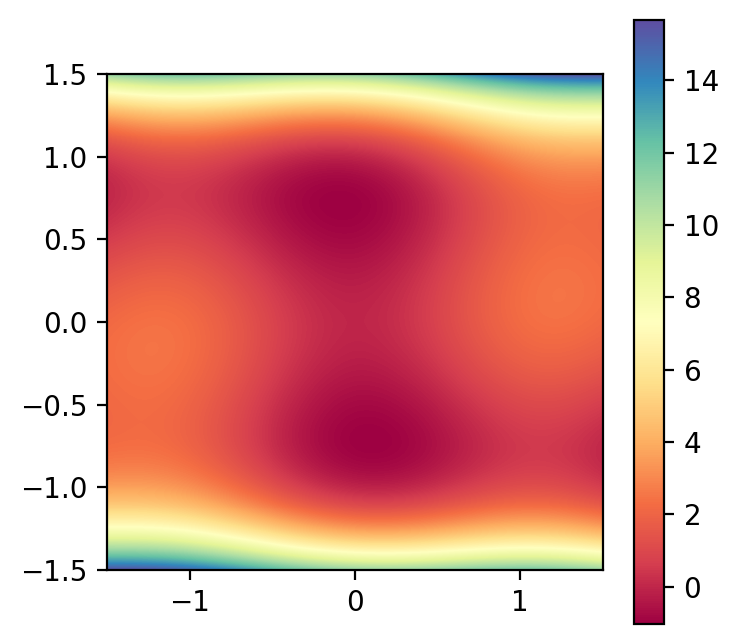

In [8]:
side = np.linspace(objective_low, objective_high, num_discrete_per_dim)
X,Y = np.meshgrid(side,side)
combs = PBO.acquisitions.dts.combinations(np.expand_dims(side, axis=1))
fvals = objective(combs)
preds = tf.transpose(tf.reshape(fvals, [num_discrete_per_dim, num_discrete_per_dim]))
plt.figure(figsize=(4, 4), dpi=200)
plt.imshow(preds, 
           interpolation='nearest', 
           extent=(objective_low, objective_high, objective_low, objective_high), 
           origin='lower', 
           cmap='Spectral')
plt.colorbar()

In [9]:
def plot_gp(model, inducing_points, inputs, title, cmap="Spectral"):

    side = np.linspace(objective_low, objective_high, num_discrete_per_dim)
    combs = PBO.acquisitions.dts.combinations(np.expand_dims(side, axis=1))
    predictions = model.predict_y(combs)
    preds = tf.transpose(tf.reshape(predictions[0], [num_discrete_per_dim, num_discrete_per_dim]))
    variances = tf.transpose(tf.reshape(predictions[1], [num_discrete_per_dim, num_discrete_per_dim]))

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.suptitle(title)
    fig.set_size_inches(18.5, 6.88)
    fig.set_dpi((200))

    ax1.axis('equal')
    im1 = ax1.imshow(preds, 
                     interpolation='nearest', 
                     extent=(objective_low, objective_high, objective_low, objective_high), 
                     origin='lower', 
                     cmap=cmap)
    ax1.plot(inducing_points[:, 0], inducing_points[:, 1], 'kx', mew=2)
    ax1.plot(inputs[:, 0], inputs[:, 1], 'ko', mew=2, color='w')
    ax1.set_title("Mean")
    ax1.set_xlabel("x0")
    ax1.set_ylabel("x1")
    fig.colorbar(im1, ax=ax1)

    ax2.axis('equal')
    im2 = ax2.imshow(variances, 
                     interpolation='nearest', 
                     extent=(objective_low, objective_high, objective_low, objective_high), 
                     origin='lower', 
                     cmap=cmap)
    ax2.plot(inducing_points[:, 0], inducing_points[:, 1], 'kx', mew=2)
    ax2.plot(inputs[:, 0], inputs[:, 1], 'ko', mew=2, color='w')
    ax2.set_title("Variance")
    ax2.set_xlabel("x0")
    ax2.set_ylabel("x1")
    fig.colorbar(im2, ax=ax2)

    plt.savefig(fname=results_dir + title + ".png")
    plt.show()

In [10]:
def get_noisy_observation(X, objective):
    f = PBO.objectives.objective_get_f_neg(X, objective)
    return PBO.observation_model.gen_observation_from_f(X, f, 1)

In [11]:
#added inducing vars
def train_and_visualize(X, y, num_inducing, title, inducing_variables):
    lengthscale_prior = tfp.distributions.Gamma(concentration=lengthscale_prior_alpha,
                                               rate=lengthscale_prior_beta)
    
    # Train model with data
    q_mu, q_sqrt, u, inputs, k, indifference_threshold = PBO.models.learning_stochastic.train_model_fullcov(X, y, 
                                                                         num_inducing=num_inducing,
                                                                         obj_low=objective_low,
                                                                         obj_high=objective_high,
                                                                         lengthscale=lengthscale,
                                                                         lengthscale_prior=None,
                                                                         lengthscale_lower_bound=None,
                                                                         num_steps=3000,
                                                                         indifference_threshold=None,
                                                                         inducing_vars=inducing_variables)
    likelihood = gpflow.likelihoods.Gaussian()
    model = PBO.models.learning.init_SVGP_fullcov(q_mu, q_sqrt, u, k, likelihood)
    u_mean = q_mu.numpy()
    inducing_vars = u.numpy()
    
    # Visualize model
    plot_gp(model, inducing_vars, inputs, title)
    
    return model, inputs, u_mean, inducing_vars

In [12]:
def uniform_grid(input_dims, num_discrete_per_dim, low=0., high=1.):
    """
    Returns an array with all possible permutations of discrete values in input_dims number of dimensions.
    :param input_dims: int
    :param num_discrete_per_dim: int
    :param low: int
    :param high: int
    :return: tensor of shape (num_discrete_per_dim ** input_dims, input_dims)
    """
    num_points = num_discrete_per_dim ** input_dims
    out = np.zeros([num_points, input_dims])
    discrete_points = np.linspace(low, high, num_discrete_per_dim)
    for i in range(num_points):
        for dim in range(input_dims):
            val = num_discrete_per_dim ** (dim)
            out[i, dim] = discrete_points[int((i // val) % num_discrete_per_dim)]
    return out

This function is our main metric for the performance of the acquisition function: The closer the model's best guess to the global minimum, the better.

In [13]:
def best_guess(model):
    """
    Returns a GP model's best guess of the global maximum of f.
    """
    xx = uniform_grid(input_dims, num_discrete_per_dim, low=objective_low, high=objective_high)
    res = model.predict_f(xx)[0].numpy()
    return xx[np.argmax(res)]

Store the results in these arrays:

In [14]:
num_data_at_end = int((num_init_points-1) * num_init_points / 2 + num_evals)
X_results = np.zeros([num_runs, num_data_at_end, num_choices, input_dims])
y_results = np.zeros([num_runs, num_data_at_end, 1, input_dims])
best_guess_results = np.zeros([num_runs, num_evals, input_dims])

Create the initial values for each run:

In [15]:
np.random.seed(0)
init_points = np.random.uniform(low=objective_low, high=objective_high, size=[num_runs, num_init_points, input_dims])
num_combs = int((num_init_points-1) * num_init_points / 2)
init_vals = np.zeros([num_runs, num_combs, num_choices, input_dims])
for run in range(num_runs):
    cur_idx = 0
    for init_point in range(num_init_points-1):
        for next_point in range(init_point+1, num_init_points):
            init_vals[run, cur_idx, 0] = init_points[run, init_point]
            init_vals[run, cur_idx, 1] = init_points[run, next_point]
            cur_idx += 1

The following loops carry out the Bayesian optimization algorithm over a number of runs, with a fixed number of evaluations per run.

In [16]:
np.random.seed(1)
draws = np.random.uniform(low=objective_low, 
                                         high=objective_high, 
                                         size=(num_evals, input_dims))

In [17]:
draws

array([[-0.24893399,  0.66097348],
       [-1.49965688, -0.59300228],
       [-1.05973233, -1.22298422],
       [-0.94121937, -0.46331782],
       [-0.30969758,  0.1164502 ],
       [-0.24241646,  0.5556585 ],
       [-0.88664325,  1.13435231],
       [-1.41783722,  0.51140253],
       [-0.24808559,  0.17606949],
       [-1.07883918, -0.90569553],
       [ 0.90223371,  1.40478473],
       [-0.55972747,  0.57696785],
       [ 1.12916746,  1.18381999],
       [-1.24486737, -1.38283565],
       [-0.99050874,  1.13442751],
       [-1.2049595 , -0.23667712],
       [ 1.37366859,  0.09949585],
       [ 0.57563134, -0.55345311],
       [ 0.55950278,  1.00387702],
       [-1.44513517,  0.75043294]])

In [18]:
def get_noiseless_observation(X, objective):
    idx = np.argmin(PBO.objectives.six_hump_camel(X), axis=-1)
    lst = []
    for i in range(X.shape[0]):
        lst.append(X[i][idx[i]])
    return np.array(lst)

Beginning run 0
Indifference_threshold is trainable.
[<tf.Variable 'q_mu:0' shape=(3, 1) dtype=float64, numpy=
array([[0.],
       [0.],
       [0.]])>, <tf.Variable 'q_sqrt_latent:0' shape=(1, 3, 3) dtype=float64, numpy=
array([[[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]]])>, <tf.Variable 'Variable:0' shape=() dtype=float64, numpy=0.1>, <tf.Variable 'Variable:0' shape=(2,) dtype=float64, numpy=array([-0.43275213, -0.43275213])>, <tf.Variable 'Variable:0' shape=() dtype=float64, numpy=0.5413248546129181>, <tf.Variable 'u:0' shape=(3, 2) dtype=float64, numpy=
array([[ 0.15544907,  0.63873082],
       [ 0.30706123,  0.12529185],
       [-0.23171448,  0.44298589]])>]
Instructions for updating:
Use tf.identity instead.
Negative ELBO at step 0: 3.0166585713270946 in 0.7752s
<tf.Variable 'u:0' shape=(3, 2) dtype=float64, numpy=
array([[ 0.15644907,  0.63973082],
       [ 0.30806122,  0.12429186],
       [-0.23271448,  0.4419859 ]])>
Negative ELBO at step 500: 1.9428627031295553

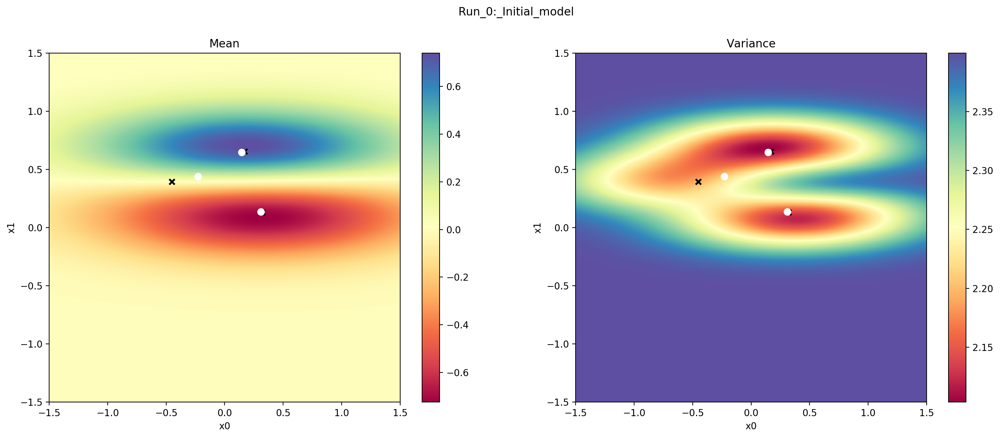

Beginning evaluation 0
Evaluation 0: Next query is [[ 0.14644051  0.6455681 ]
 [-0.24893399  0.66097348]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]]
Evaluation 0: Training model
Indifference_threshold is trainable.
[<tf.Variable 'q_mu:0' shape=(4, 1) dtype=float64, numpy=
array([[0.],
       [0.],
       [0.],
       [0.]])>, <tf.Variable 'q_sqrt_latent:0' shape=(1, 4, 4) dtype=float64, numpy=
array([[[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.]]])>, <tf.Variable 'Variable:0' shape=() dtype=float64, numpy=0.1>, <tf.Variable 'Variable:0' shape=(2,) dtype=float64, numpy=array([-0.43275213, -0.43275213])>, <tf.Variable 'Variable:0' shape=() 

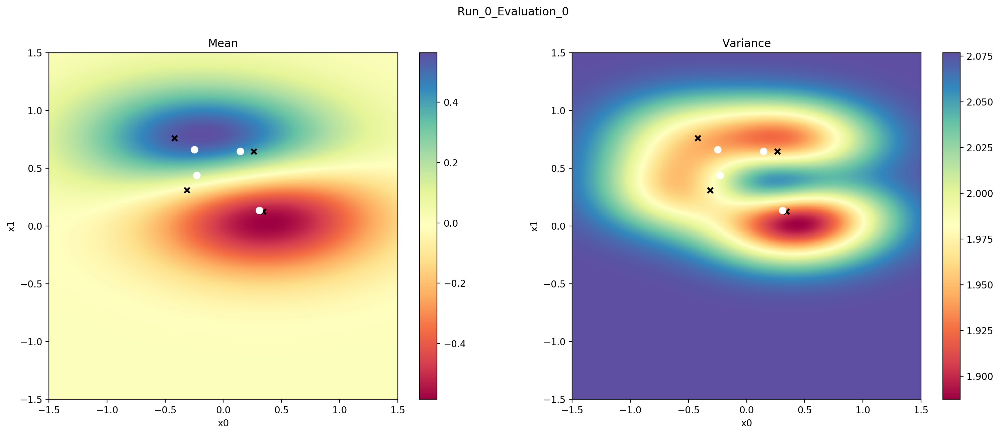

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.0769646478242063
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.69268833 0.35000103]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(4, 2)",float64,"[[-0.31079644, 0.31019268..."
SVGP.q_mu,Parameter,,,False,"(4, 1)",float64,[[-0.05077572...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 4, 4)",float64,"[[[0.98862731, 0., 0...."


Best guess: [-0.18168168  0.79429429]
Best guess val: -0.9460090149338877
Beginning evaluation 1
Evaluation 1: Next query is [[ 0.14644051  0.6455681 ]
 [-1.49965688 -0.59300228]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.14644051  0.6455681 ]]
Evaluation 1: Training model
Indifference_threshold is trainable.
[<tf.Variable 'q_mu:0' shape=(5, 1) dtype=float64, numpy=
array([[0.],
       [0.],
       [0.],
       [0.],
       [0.]])>, <tf.Variable 'q_sqrt_latent:0' shape=(1, 5, 5) dtype=float64, numpy=
array([[[1., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 0., 1., 0.],
       

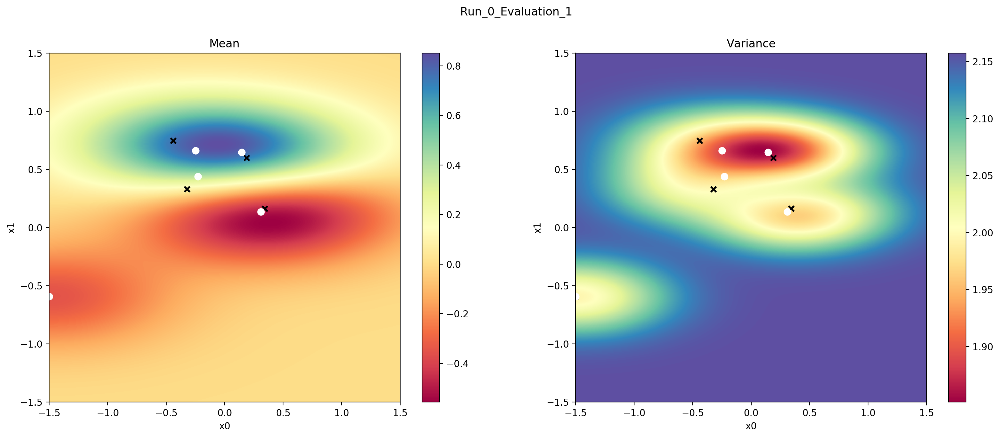

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1575451188243253
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.74016917 0.30336868]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(5, 2)",float64,"[[-0.32178215, 0.33025684..."
SVGP.q_mu,Parameter,,,False,"(5, 1)",float64,[[0.10256457...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 5, 5)",float64,"[[[0.99916618, 0., 0...."


Best guess: [-0.05855856  0.71621622]
Best guess val: -1.0275764158453047
Beginning evaluation 2
Evaluation 2: Next query is [[ 0.14644051  0.6455681 ]
 [-1.05973233 -1.22298422]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]]
Evaluation 2: Training model
Indifference_threshold is trainable.
[<tf.Variable 'q_mu:0' shape=(6, 1) dtype=float64, numpy=
array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])>, <tf.Variable 'q_sqrt_latent:0' shape=(1, 6, 6) dtype=float64, numpy=
array([[[1., 0., 0., 0., 0., 

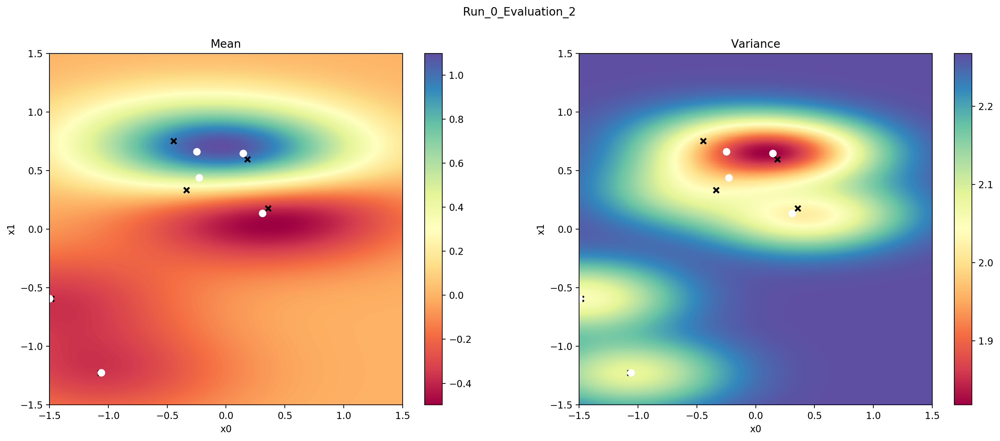

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.2679426909039635
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.78290014 0.29705358]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(6, 2)",float64,"[[-0.33485884, 0.33205554..."
SVGP.q_mu,Parameter,,,False,"(6, 1)",float64,[[0.19237257...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 6, 6)",float64,"[[[1.01865672, 0., 0...."


Best guess: [-0.04354354  0.70720721]
Best guess val: -1.0232176135510076
Beginning evaluation 3
Evaluation 3: Next query is [[-0.2290356   0.43768234]
 [-0.94121937 -0.46331782]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]]
Evaluation 3: Training model
Indifference_threshold is trainable.
[<tf.Variable 'q_mu:0' shape=(7, 1) dtype=float64, numpy=
array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])>, 

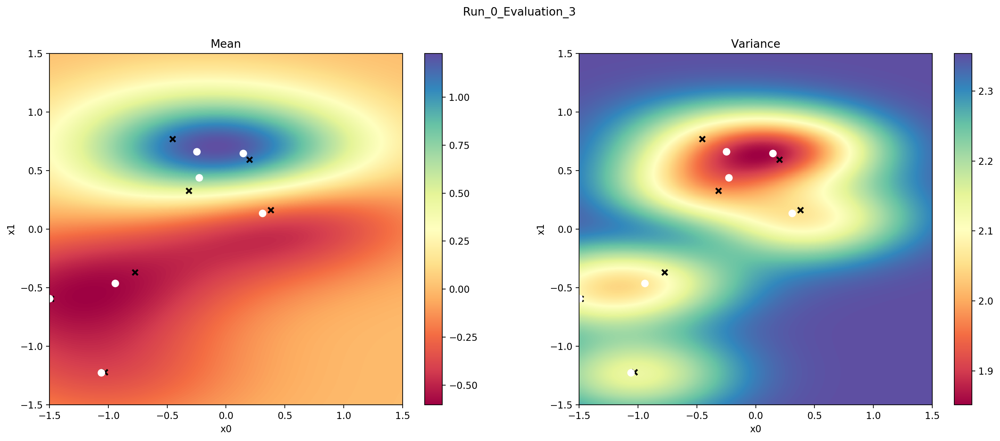

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.353831111861224
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.80454736 0.35050088]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(7, 2)",float64,"[[-0.31418425, 0.32554815..."
SVGP.q_mu,Parameter,,,False,"(7, 1)",float64,[[0.46376712...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 7, 7)",float64,"[[[0.99368441, 0., 0...."


Best guess: [-0.07657658  0.70720721]
Best guess val: -1.0307716815837047
Beginning evaluation 4
Evaluation 4: Next query is [[ 0.30829013  0.13464955]
 [-0.30969758  0.1164502 ]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.30969758  0.1164502 ]]
Evaluation 4: Training model
Indifference_threshold is trainable.
[<tf.Variable 'q_mu:0' shape=(8, 1) dtype=float64, numpy=
array([[0

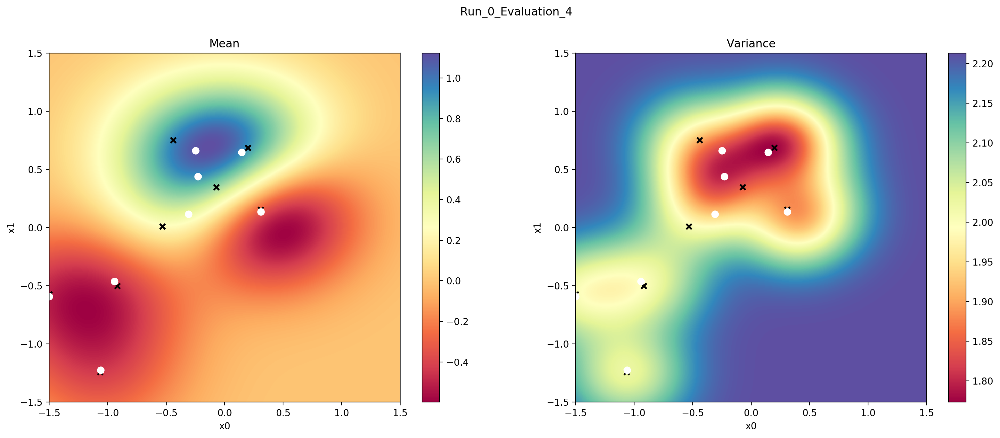

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.213172145345979
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.50025846 0.41640744]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(8, 2)",float64,"[[-0.07104307, 0.34572322..."
SVGP.q_mu,Parameter,,,False,"(8, 1)",float64,[[0.64161965...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 8, 8)",float64,"[[[0.91865843, 0., 0...."


Best guess: [-0.13663664  0.7012012 ]
Best guess val: -1.0215846020828665
Beginning evaluation 5
Evaluation 5: Next query is [[-0.2290356   0.43768234]
 [-0.24241646  0.5556585 ]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.30969758  0.1164502 ]
 [-0.24241646  0.5556585 ]]
Evaluation 5: Training model
Indifference_thresh

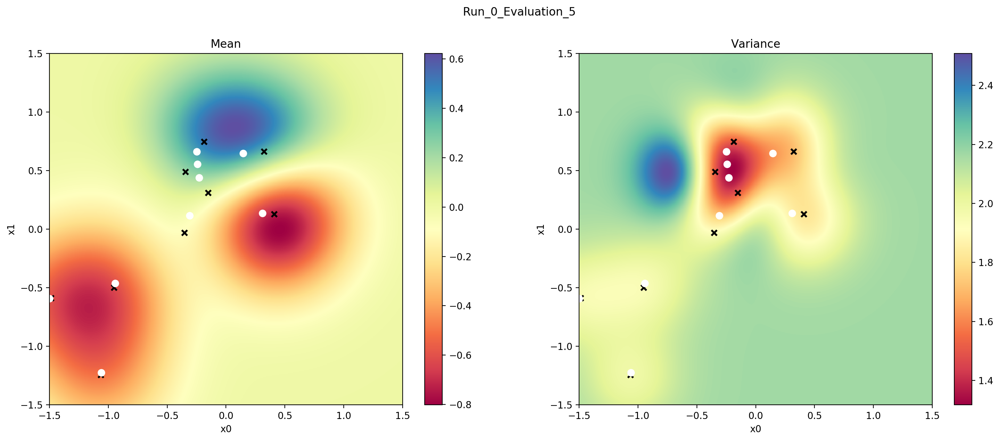

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1651479504030102
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.4100973 0.42355977]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(9, 2)",float64,"[[-0.15218012, 0.30962096..."
SVGP.q_mu,Parameter,,,False,"(9, 1)",float64,[[0.03975187...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 9, 9)",float64,"[[[0.71057811, 0., 0...."


Best guess: [0.06756757 0.86936937]
Best guess val: -0.6613001548209146
Beginning evaluation 6
Evaluation 6: Next query is [[-0.2290356   0.43768234]
 [-0.88664325  1.13435231]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.30969758  0.1164502 ]
 [-0.24241646  0.555

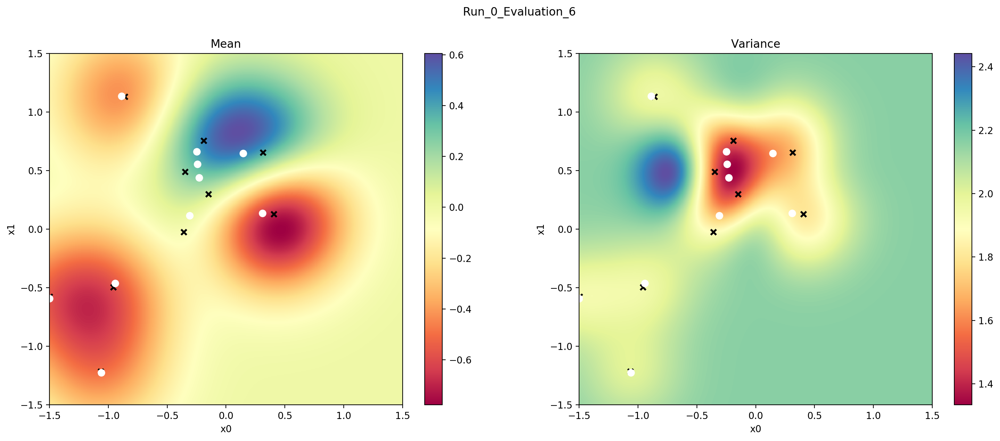

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1626877406534717
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.41203787 0.41621002]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(10, 2)",float64,"[[-0.14857312, 0.29719448..."
SVGP.q_mu,Parameter,,,False,"(10, 1)",float64,[[0.09948727...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 10, 10)",float64,"[[[7.09582927e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [0.1036036  0.83633634]
Best guess val: -0.7115245279652009
Beginning evaluation 7
Evaluation 7: Next query is [[-0.30969758  0.1164502 ]
 [-1.41783722  0.51140253]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0

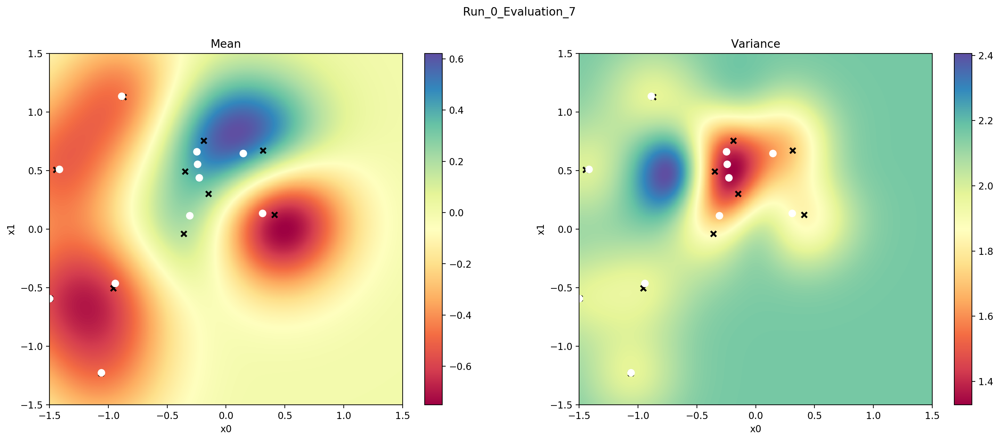

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1633845131223408
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.41485031 0.41885099]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(11, 2)",float64,"[[-0.14693493, 0.29892623..."
SVGP.q_mu,Parameter,,,False,"(11, 1)",float64,[[0.2436899...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 11, 11)",float64,"[[[7.07676373e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [0.08558559 0.82732733]
Best guess val: -0.7638882077439966
Beginning evaluation 8
Evaluation 8: Next query is [[ 0.30829013  0.13464955]
 [-0.24808559  0.17606949]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290356   0.43768234]
 [-0.24893399  0.66097348]
 [ 0.1464405

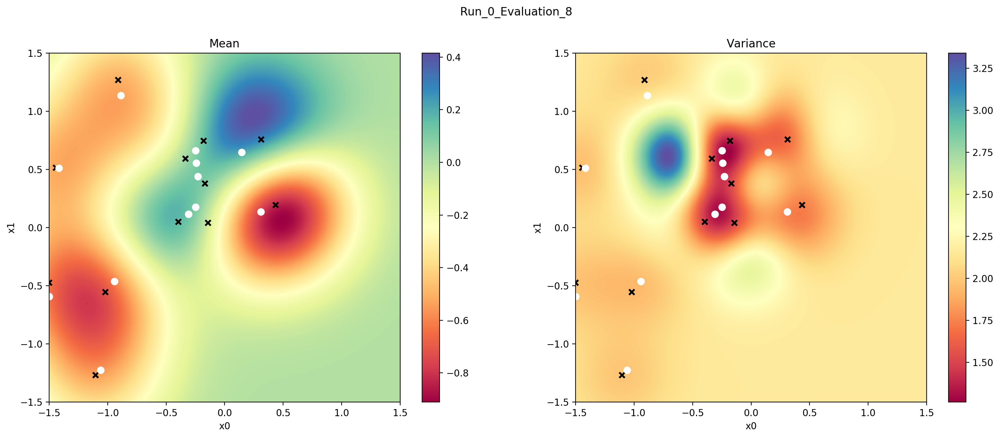

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.163938691404844
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.41981144 0.42975207]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(12, 2)",float64,"[[-0.16888351, 0.37807843..."
SVGP.q_mu,Parameter,,,False,"(12, 1)",float64,[[0.10022013...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 12, 12)",float64,"[[[7.25388456e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [0.25075075 0.96546547]
Best guess val: 0.2322987998227568
Beginning evaluation 9
Evaluation 9: Next query is [[-1.05973233 -1.22298422]
 [-1.07883918 -0.90569553]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]]
y: [[ 0.14644051  0.6455681 ]
 [ 0.14644051  0.6455681 ]
 [-0.2290

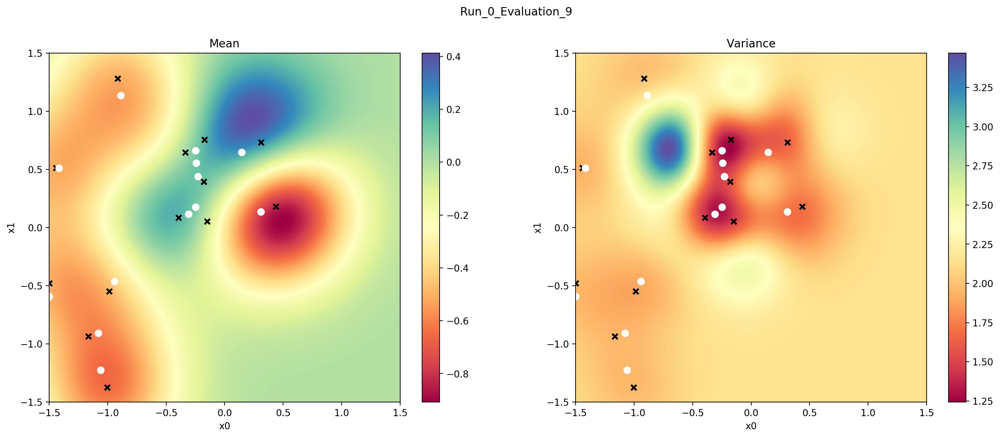

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1600573260303297
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.42193878 0.43177693]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(13, 2)",float64,"[[-0.17567501, 0.39263673..."
SVGP.q_mu,Parameter,,,False,"(13, 1)",float64,[[0.12503402...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 13, 13)",float64,"[[[7.59092648e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [0.23273273 0.94744745]
Best guess val: 0.06357542625815987
Beginning evaluation 10
Evaluation 10: Next query is [[-0.94121937 -0.46331782]
 [ 0.90223371  1.40478473]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-0.94121937 -0.46331782]
  [ 0.90223371  1.40478473]]]
y: [[

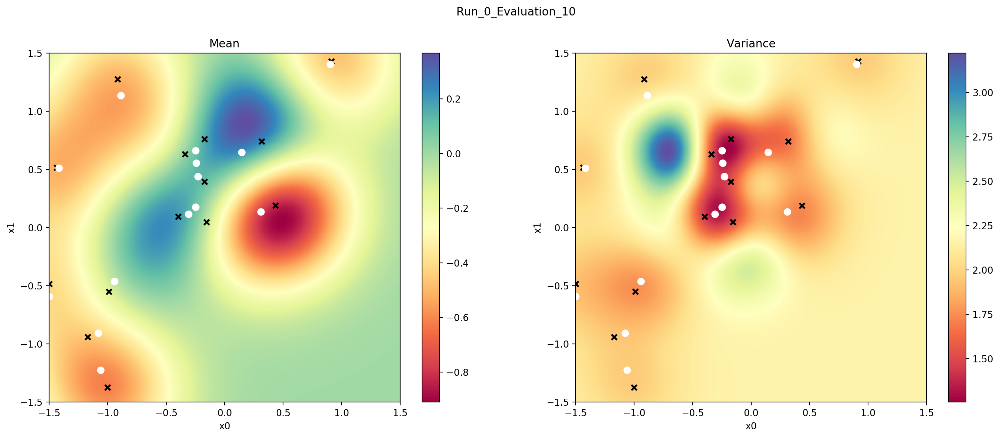

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1642642734029902
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.42046606 0.429872 ]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(14, 2)",float64,"[[-0.16986501, 0.3927302..."
SVGP.q_mu,Parameter,,,False,"(14, 1)",float64,[[0.11052549...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 14, 14)",float64,"[[[7.29679664e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [0.16966967 0.8993994 ]
Best guess val: -0.3522559241542478
Beginning evaluation 11
Evaluation 11: Next query is [[-1.07883918 -0.90569553]
 [-0.55972747  0.57696785]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-0.94121937 -0.46331782]
  [ 0.90223371  1.40478473]]

 [[-1

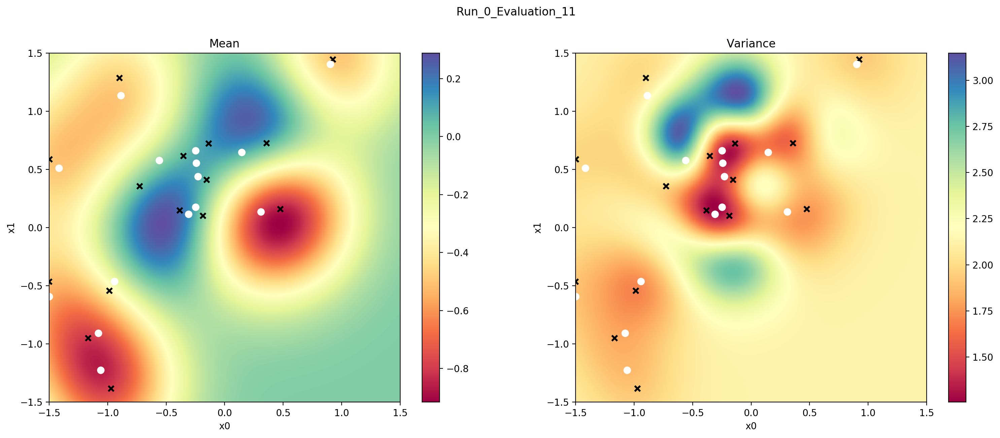

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1285596567765432
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.41919031 0.45499136]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(15, 2)",float64,"[[-0.15353128, 0.41006453..."
SVGP.q_mu,Parameter,,,False,"(15, 1)",float64,[[0.0484213...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 15, 15)",float64,"[[[7.86326766e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.53903904  0.03153153]
Best guess val: 0.9721632301528544
Beginning evaluation 12
Evaluation 12: Next query is [[-1.07883918 -0.90569553]
 [ 1.12916746  1.18381999]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-0.94121937 -0.46331782]
  [ 0.90223371  1.40478473]]

 [[-

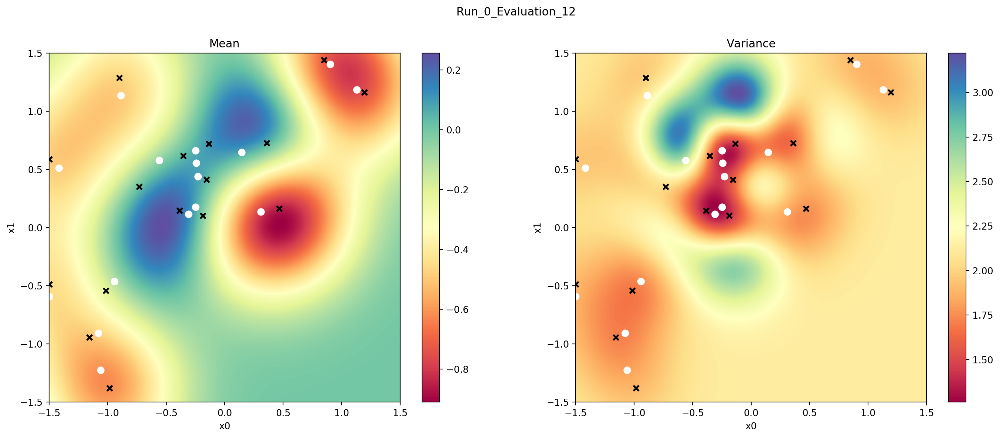

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1285914791361369
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.41845278 0.45548221]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(16, 2)",float64,"[[-0.15258142, 0.4110234..."
SVGP.q_mu,Parameter,,,False,"(16, 1)",float64,[[0.03781148...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 16, 16)",float64,"[[[7.69891181e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.54204204  0.01651652]
Best guess val: 0.992368510754497
Beginning evaluation 13
Evaluation 13: Next query is [[-0.30969758  0.1164502 ]
 [-1.24486737 -1.38283565]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-0.94121937 -0.46331782]
  [ 0.90223371  1.40478473]]

 [[-1

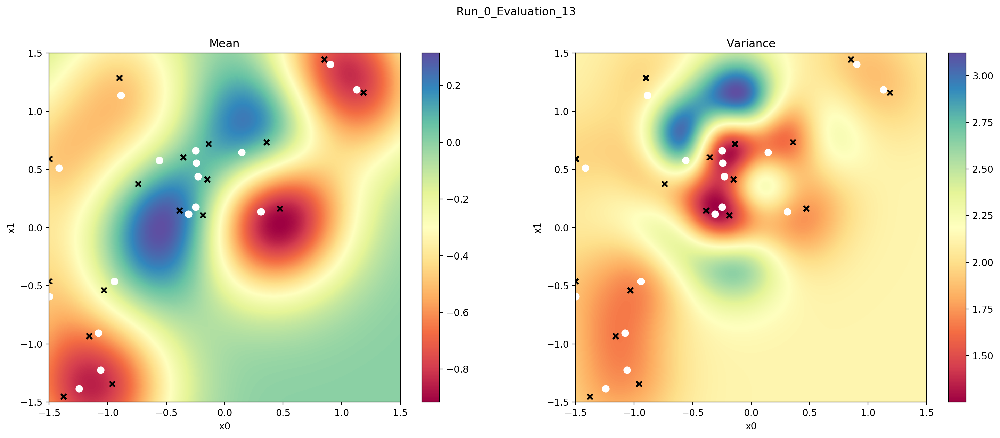

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1282528714272808
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.41776456 0.45597987]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(17, 2)",float64,"[[-0.14793912, 0.41157725..."
SVGP.q_mu,Parameter,,,False,"(17, 1)",float64,[[0.03227234...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 17, 17)",float64,"[[[7.75982219e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.54804805 -0.00750751]
Best guess val: 1.0248981641092172
Beginning evaluation 14
Evaluation 14: Next query is [[-0.30969758  0.1164502 ]
 [-0.99050874  1.13442751]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-0.94121937 -0.46331782]
  [ 0.90223371  1.40478473]]

 [[-

Negative ELBO at step 2500: 18.7335857871813 in 224.9977s
<tf.Variable 'u:0' shape=(18, 2) dtype=float64, numpy=
array([[-0.15306234,  0.41153878],
       [ 0.33708164,  0.74514958],
       [ 0.48511608,  0.16900153],
       [-0.1539294 ,  0.71967498],
       [-1.49958197, -0.48447676],
       [-0.95584887, -1.34597725],
       [-0.99295394, -0.54317642],
       [-0.38211774,  0.14938312],
       [-0.34431445,  0.59846095],
       [-0.87866803,  1.22592163],
       [-1.49987524,  0.5379689 ],
       [-0.18409371,  0.10294797],
       [-1.15332806, -0.93635843],
       [ 0.85386763,  1.46671019],
       [-0.72300525,  0.37358138],
       [ 1.19779518,  1.17118338],
       [-1.37888095, -1.46794743],
       [-1.21436671,  1.09170338]])>


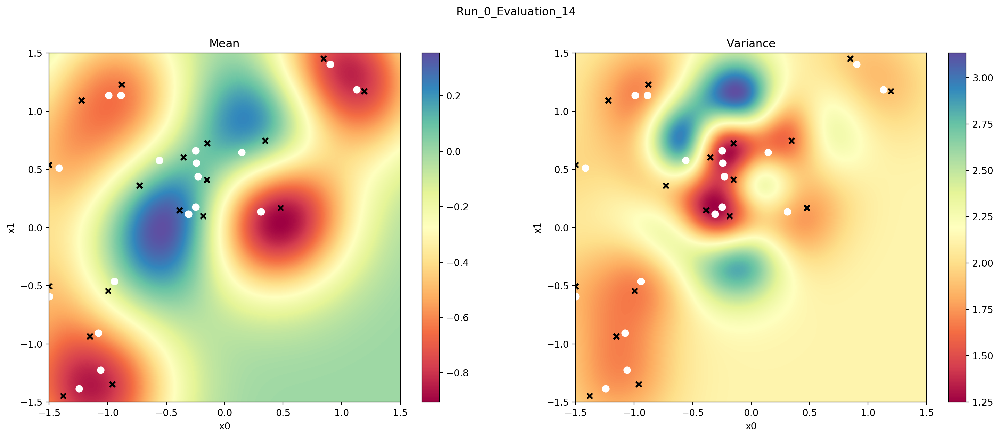

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1310422170239196
SVGP.kernel.lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.42140345 0.45319453]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(18, 2)",float64,"[[-0.14946994, 0.41041459..."
SVGP.q_mu,Parameter,,,False,"(18, 1)",float64,[[0.04011326...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 18, 18)",float64,"[[[7.91701163e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-0.53903904 -0.01051051]
Best guess val: 0.9983566934751111
Beginning evaluation 15
Evaluation 15: Next query is [[-0.88664325  1.13435231]
 [-1.2049595  -0.23667712]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.14644051  0.6455681 ]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[ 0.14644051  0.6455681 ]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[ 0.30829013  0.13464955]
  [-0.30969758  0.1164502 ]]

 [[-0.2290356   0.43768234]
  [-0.24241646  0.5556585 ]]

 [[-0.2290356   0.43768234]
  [-0.88664325  1.13435231]]

 [[-0.30969758  0.1164502 ]
  [-1.41783722  0.51140253]]

 [[ 0.30829013  0.13464955]
  [-0.24808559  0.17606949]]

 [[-1.05973233 -1.22298422]
  [-1.07883918 -0.90569553]]

 [[-0.94121937 -0.46331782]
  [ 0.90223371  1.40478473]]

 [[-

KeyboardInterrupt: 

In [19]:
for run in range(num_runs):
    print("Beginning run %s" % (run))
    
    X = init_vals[run]
    y = get_noiseless_observation(X, objective)
    
    inducing_variables = init_points[run]
    inducing_variables += np.random.normal(0, 0.01, inducing_variables.shape)

    
    model, inputs, u_mean, inducing_vars = train_and_visualize(X, y, num_inducing_init, 
                                                               "Run_{}:_Initial_model".format(run),
                                                               inducing_variables)
    inducing_variables = inputs

    for evaluation in range(num_evals):
        print("Beginning evaluation %s" % (evaluation)) 
        
        existing_idx = np.random.randint(0, inputs.shape[0])
        existing_input = inputs[existing_idx]
#         random_input = np.random.uniform(low=objective_low, 
#                                          high=objective_high, 
#                                          size=(1, input_dims))
        
        next_query = np.zeros((num_choices, input_dims))
        next_query[0, :] = existing_input
        next_query[1, :] = draws[evaluation]
        print("Evaluation %s: Next query is %s" % (evaluation, next_query))

        X = np.concatenate([X, [next_query]])
        # Evaluate objective function
        y = np.concatenate([y, get_noiseless_observation(np.expand_dims(next_query, axis=0), objective)], axis=0)
        
        print("X: {}".format(X))
        print("y: {}".format(y))
        
        inducing_variables = np.concatenate([inducing_variables, 
                                             np.expand_dims(draws[evaluation], axis=0) + np.random.normal(0, 0.01)])
        
        print("Evaluation %s: Training model" % (evaluation))
        model, inputs, u_mean, inducing_vars = train_and_visualize(X, y, 
                                                                   num_inducing_init + evaluation + 1, 
                                                                   "Run_{}_Evaluation_{}".format(run, evaluation),
                                                                   inducing_variables)
        
        
        print_summary(model)
        print("Best guess: {}".format(best_guess(model)))
        print("Best guess val: {}".format(objective(best_guess(model))))
        
        # Save model
        pickle.dump((X, y, inputs, 
                     model.kernel.variance, 
                     model.kernel.lengthscale, 
                     model.likelihood.variance, 
                     inducing_vars, 
                     model.q_mu, 
                     model.q_sqrt), 
                    open(results_dir + "Model_Run_{}_Evaluation_{}.p".format(run, evaluation), "wb"))

        best_guess_results[run, evaluation, :] = best_guess(model)

    X_results[run] = X
    y_results[run] = y

In [ ]:
print_summary(model)

In [ ]:
model.q_mu

In [ ]:
model.inducing_variable.Z

In [ ]:
vals = pickle.load(open( "results/PBO_RANDOM_TEST2_SHC/Model_Run_0_Evaluation_9.p", "rb" ))

In [ ]:
vals

In [ ]:
vals[6]

In [ ]:
vals[7].numpy()

In [21]:
objective(np.array([[0.06756757, 0.86936937]]))

array([-0.66130015])

In [ ]:
X.shape

In [ ]:
idx = np.expand_dims(np.argmin(PBO.objectives.six_hump_camel(X), axis=-1), axis=1)

In [ ]:
lst = []
for i in range(X.shape[0]):
    lst.append(X[i][idx[i]])

In [ ]:
y.shape

In [ ]:
f.shape

In [ ]:
f = np.array(lst)

In [ ]:
np.equal(y, f)

In [ ]:
inducing_variables

In [ ]:
pickle.dump((X_results, y_results, best_guess_results), open(results_dir + "Xybestguess.p", "wb"))

In [ ]:
def dist(x, y):
    """
    x and y have shape (..., input_dims)
    """
    return np.sqrt(np.sum((x - y) * (x - y), axis=-1))

In [ ]:
xx = uniform_grid(input_dims, num_discrete_per_dim, low=objective_low, high=objective_high)
global_min = xx[np.argmin(objective(xx))][0]

for i in range(best_guess_results.shape[0]):
    diff_from_min = dist(best_guess_results[i], global_min)
    
    x_axis = list(range(num_combs+1, num_combs+1+num_evals))
    plt.figure(figsize=(12, 6))
    plt.plot(x_axis, diff_from_min, 'kx', mew=2)
    plt.xticks(x_axis)
    plt.xlabel('Evaluations', fontsize=18)
    plt.ylabel('Best guess distance', fontsize=16)
    plt.title("Run %s" % i)
    plt.show()

In [ ]:
np.mean(PBO.objectives.six_hump_camel(best_guess_results), axis=0)